# CSE-372 High Performance Computing: PCA Reconstruction

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy import io

In [2]:
comp_hsi = np.load('compressed_hsi.npy')
pca_components_matrix = np.load('pca_components_matrix.npy')
original_image_dimensions_mean = np.load('original_image_dimensions_mean.npy')

In [3]:
print(comp_hsi.shape)
print(pca_components_matrix.shape)
print(original_image_dimensions_mean.shape)

(512, 217, 20)
(224, 20)
(1, 224)


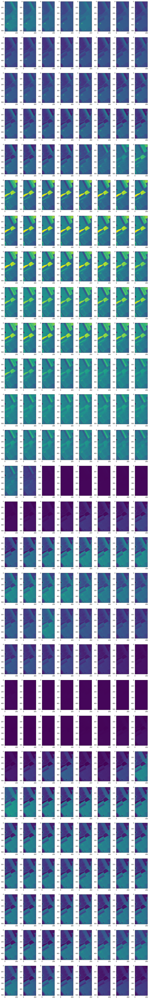

In [4]:
reconstructed_image = comp_hsi @ pca_components_matrix.T + original_image_dimensions_mean
_, axes = plt.subplots(28, 8, figsize=(18,126))
axes = axes.flatten()
for i in range(224):
    axes[i].imshow(reconstructed_image[:,:,i])

In [7]:
data = {}
data['salinas'] = reconstructed_image.astype('uint8')
io.savemat('reconstructed_image.mat', data)

## Analysis

In [8]:
# Load original image
original = io.loadmat('Salinas.mat')['salinas']

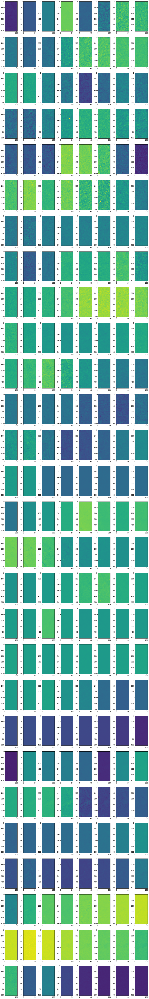

In [9]:
diff = original-reconstructed_image
_, axes = plt.subplots(28, 8, figsize=(18,126))
axes = axes.flatten()
for i in range(224):
    axes[i].imshow(diff[:,:,i])

### PSNR Calculation

In [15]:
def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

d=psnr(original, reconstructed_image.astype('uint8'))
print(d)

25.36113371148998
